QR code saved as ../data/qr/phase_qr_code.tif
QR code saved as ../data/qr/abs_qr_code.tif


Stage 1242  LR  score: 100%|██████████| 600/600 [02:43<00:00,  3.66it/s, attenuation_ssim=0.997, phase_ssim=0.995, psnr=54.296, ssim=0.999]


(1242, 1242) PI.shape (1242, 1242) I.shape


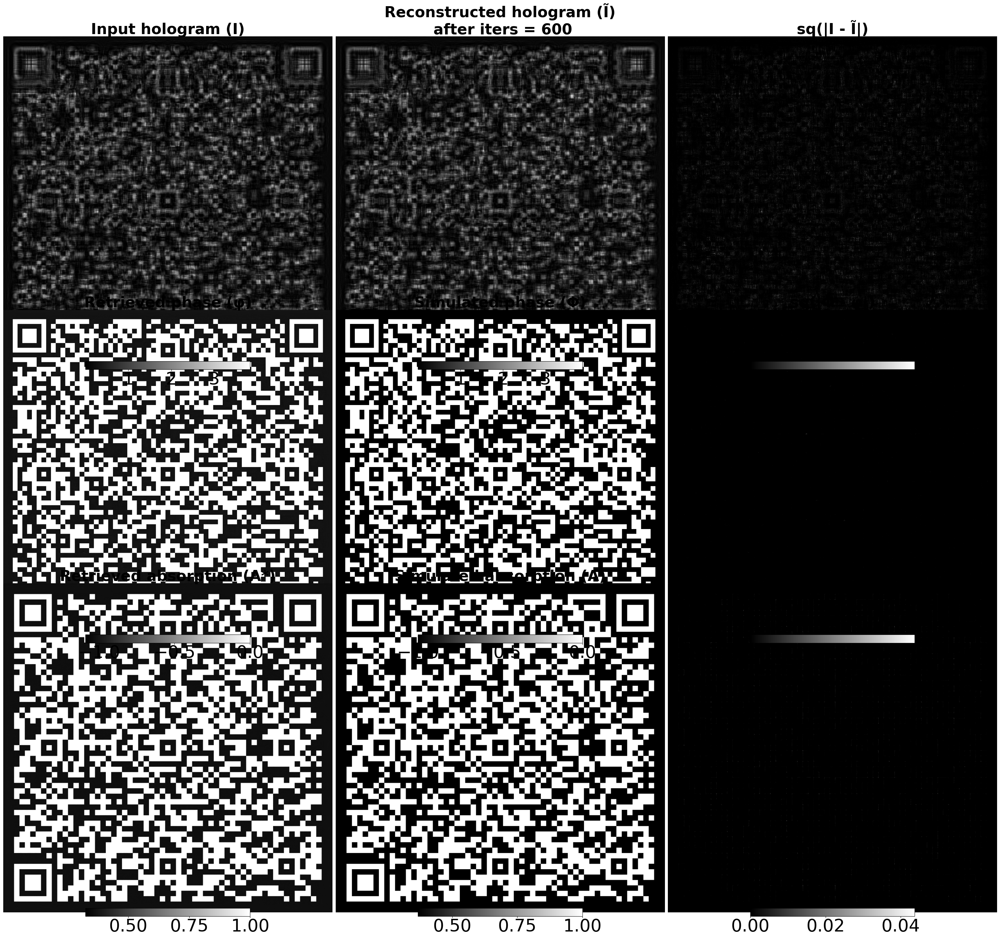

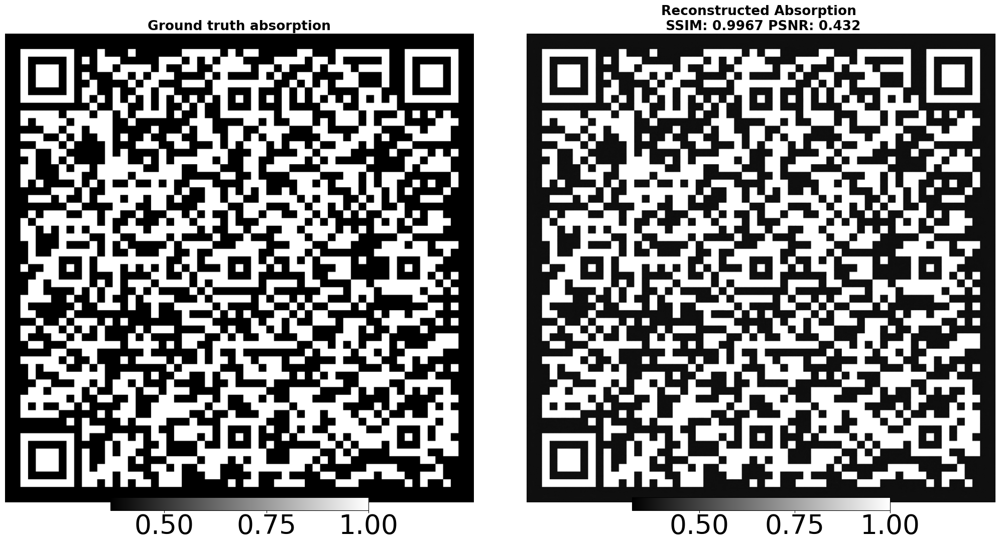

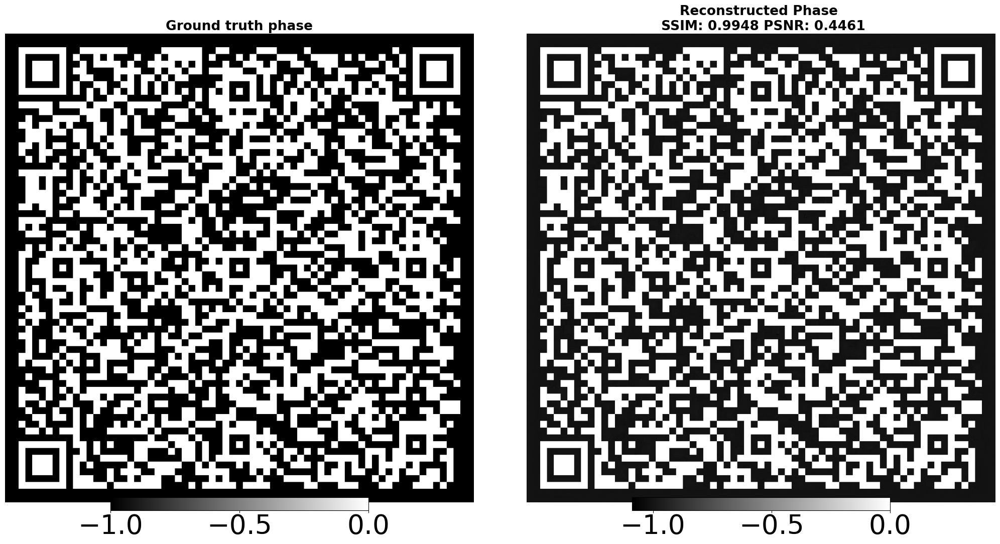

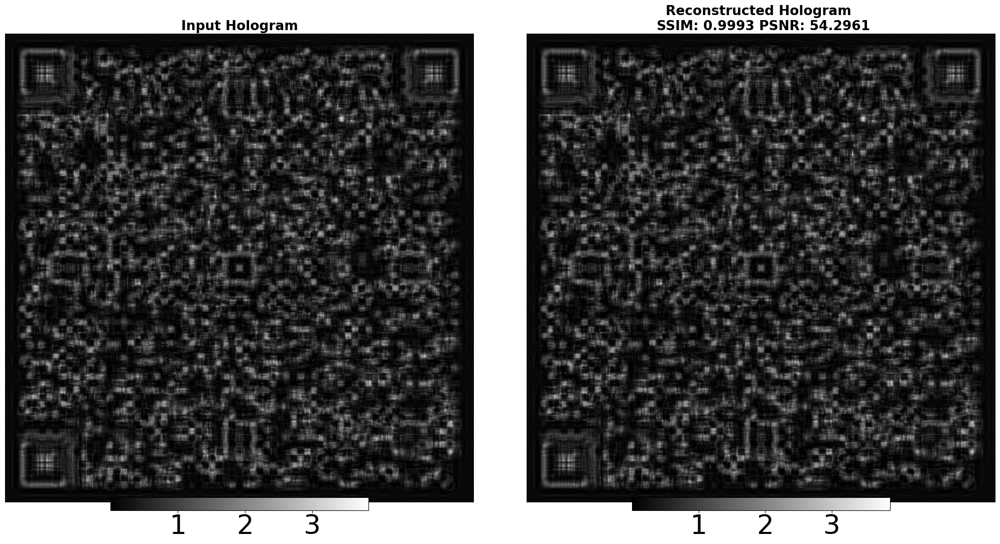

Stage 1242  LR  score:  74%|███████▍  | 446/600 [02:33<01:49,  1.41it/s, attenuation_ssim=0.938, phase_ssim=0.894, psnr=33.908, ssim=0.940]

In [ ]:
from init_lib import *
# Example usage
image_path = '../data/qr/'
qr_data = [
    ("Phase (V20|BS10|B4): A Good Phase: Solving the Near-field Phase Retrieval Inverse Problem Quantitatively Using Selfphish. Phase retrieval is a non-linear, ill-posed inverse problem that is essential for accurate wavefront reconstruction prior to tomographic analysis. Selfphish enables quantitative phase retrieval with high precision.", image_path + 'phase_qr_code.tif'),
    ("Absorbance: Experimental results demonstrate Selfphish’s superior accuracy and robustness across diverse imaging scenarios. underscoring its potential to significantly enhance phase retrieval and image quality in X-ray imaging and beyond.", image_path + 'abs_qr_code.tif')
]

qr_images = [generate_qr_code(data, path, 10) for data, path in qr_data]

fresnel_prop = propagate_others(
    phase=qr_images[0],
    attenuation=qr_images[1],
    fresnel_number=10**(-2.5),
    task='learn_phase',
    dsf=2**0,
    iter_num=1000,
    positive_attenuation='relu',
    positive_phase='relu_inverted',
    transformation_type='ssim',
    abs_ratio=1,
    model_type='wavelet',
    wavelet='db1',
    init_model=False,
    save_model_path=image_path,
    save_model=True,
    device='cuda:0',
    add_noise=False,
    noise_factor=0.01,
    noise_type='gaussian',
    dis_type='unet',
    dis_depth=2,
    conv_num=4,
)


comparison = []
model_configs = [
    {'task': 'learn_phase', 'init_model': False, 'model_type': 'wavelet'},
    {'task': 'learn_phase', 'init_model': False, 'model_type': 'unet'}
]
vis_config = {'cmap': 'gray', 'vmode': 'show', 'min_max': False, 'colorbar': True, 'colorbar_locaiton': 'bottom', 'zoomout_location': 'bottom right', 'position': 'left', 'axis': 'off', 'axin_axis': 'off'}

for config in model_configs:
    fresnel_prop.update(config)
    model = solver(**fresnel_prop)
    model.train(iter_num=600)
    # model.visualize()

    visualize(
        [model.ground_attenuation, model.attenuation],
        title=[
            'Ground truth absorption',
            f'Reconstructed Absorption \n SSIM: {round(model.ground_att_ssim_list[-1].item(), 4)} PSNR: {round(model.ground_att_psnr_list[-1].item(), 4)}'
        ], **vis_config)

    visualize(
        [model.ground_truth, model.phase],
        title=[
            'Ground truth phase',
            f'Reconstructed Phase \n SSIM: {round(model.ground_ssim_list[-1].item(), 4)} PSNR: {round(model.ground_psnr_list[-1].item(), 4)}'
        ],**vis_config)

    visualize(
        [model.transformed_images, model.propagated_intensity],
        title=[
            'Input Hologram',
            f'Reconstructed Hologram \n SSIM: {round(model.ssim_list[-1].item(), 4)} PSNR: {round(model.psnr_list[-1].item(), 4)}'
        ],**vis_config)

    comparison.append([
        model.ssim_list,
        model.ground_ssim_list,
        model.ground_att_ssim_list,
        model.psnr_list,
        model.ground_psnr_list,
        model.ground_att_psnr_list
    ])

QR code saved as ../data/qr/phase_qr_code.tif
QR code saved as ../data/qr/abs_qr_code.tif


Stage 1242  LR  score: 100%|██████████| 600/600 [02:38<00:00,  3.79it/s, attenuation_ssim=0.997, phase_ssim=0.995, psnr=53.145, ssim=0.999]


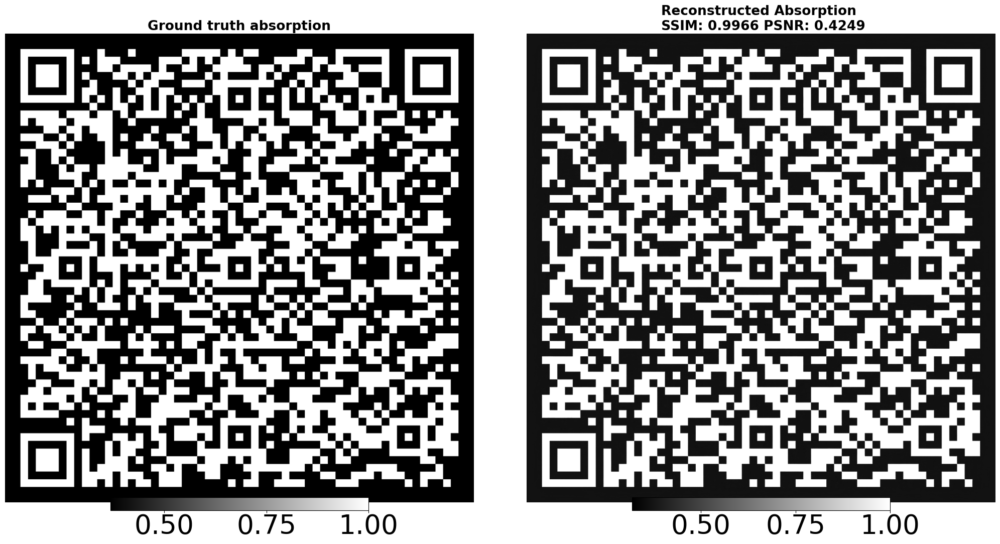

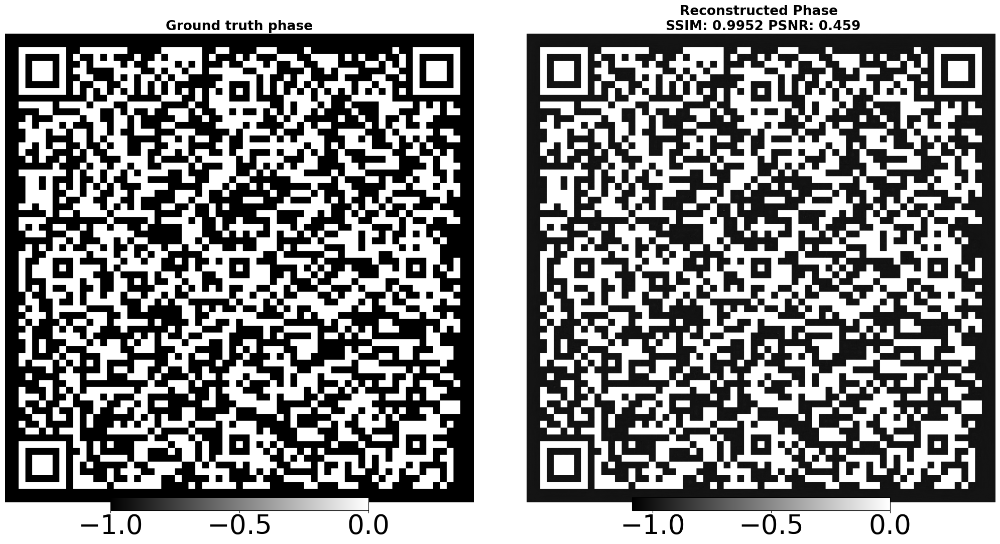

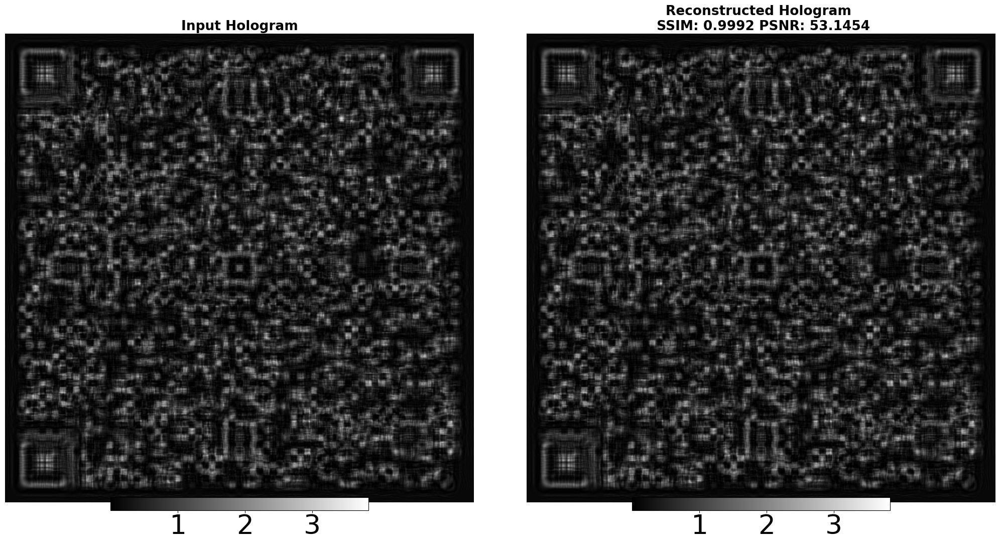

Stage 1242  LR  score: 100%|██████████| 600/600 [02:40<00:00,  3.73it/s, attenuation_ssim=0.987, phase_ssim=0.993, psnr=48.749, ssim=0.998]


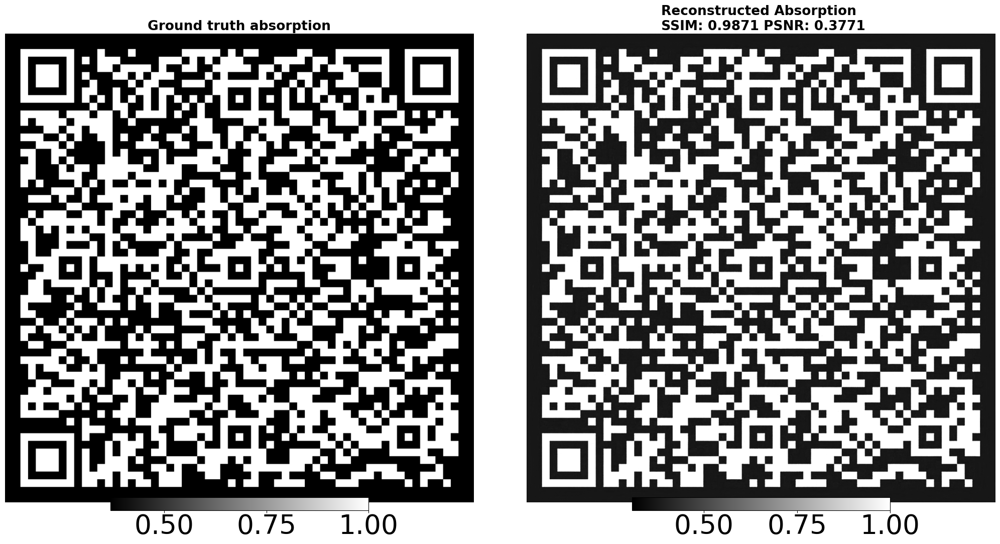

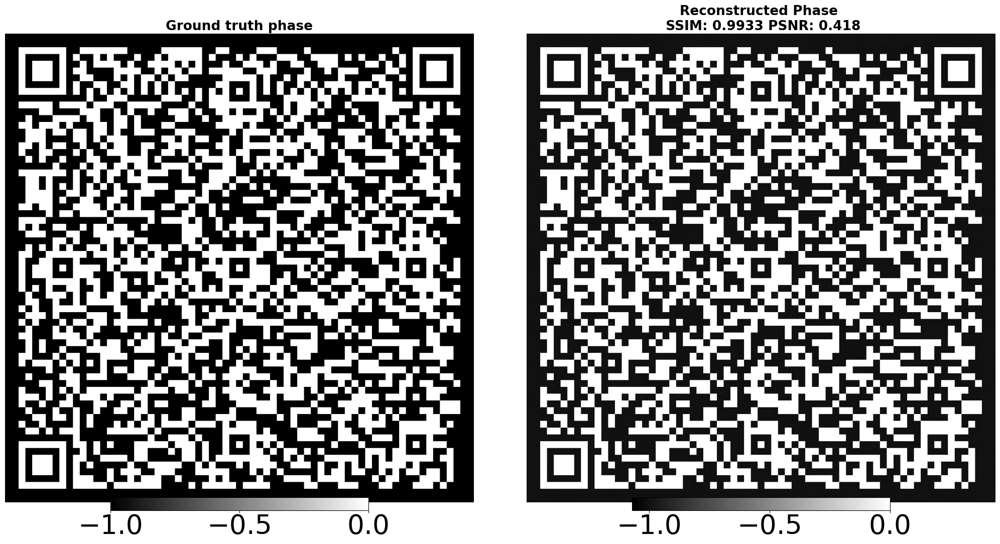

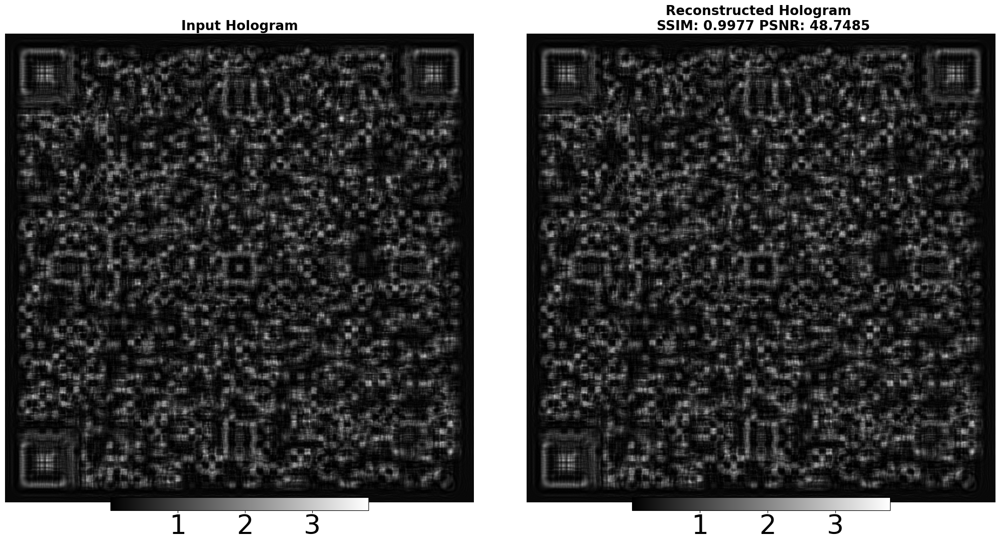

In [6]:
from init_lib import *
image_path = '../data/qr/'
qr_data = [
    ("Phase (V20|BS10|B4): A Good Phase: Solving the Near-field Phase Retrieval Inverse Problem Quantitatively Using Selfphish. Phase retrieval is a non-linear, ill-posed inverse problem that is essential for accurate wavefront reconstruction prior to tomographic analysis. Selfphish enables quantitative phase retrieval with high precision.", image_path + 'phase_qr_code.tif'),
    ("Absorbance: Experimental results demonstrate Selfphish’s superior accuracy and robustness across diverse imaging scenarios. underscoring its potential to significantly enhance phase retrieval and image quality in X-ray imaging and beyond.", image_path + 'abs_qr_code.tif')
]

qr_images = [generate_qr_code(data, path, 10) for data, path in qr_data]

fresnel_prop = propagate_others(
    phase=qr_images[0],
    attenuation=qr_images[1],
    fresnel_number=10**(-2.5),
    task='learn_phase',
    dsf=2**0,
    iter_num=1000,
    positive_attenuation='relu',
    positive_phase='relu_inverted',
    transformation_type='ssim',
    abs_ratio=1,
    model_type='wavelet',
    wavelet='db1',
    init_model=False,
    save_model_path=image_path,
    save_model=True,
    device='cuda:0',
    add_noise=False,
    noise_factor=0.01,
    noise_type='gaussian',
    dis_type='unet',
    dis_depth=2,
)


comparison = []
model_configs = [
    {'task': 'learn_phase', 'init_model': False, 'model_type': 'wavelet'},
    {'task': 'learn_phase', 'init_model': False, 'model_type': 'unet'}
]
vis_config = {'cmap': 'gray', 'vmode': 'show', 'min_max': False, 'colorbar': True, 'colorbar_locaiton': 'bottom', 'zoomout_location': 'bottom right', 'position': 'left', 'axis': 'off', 'axin_axis': 'off'}

for config in model_configs:
    fresnel_prop.update(config)
    model = solver(**fresnel_prop)
    model.train(iter_num=600)
    vis_kwargs['vmode'] = 'both'
    vis_kwargs['colorbar'] = False
    
    # model.visualize()

    visualize(
        [model.ground_attenuation, model.attenuation],
        title=[
            'Ground truth absorption',
            f'Reconstructed Absorption \n SSIM: {round(model.ground_att_ssim_list[-1].item(), 4)} PSNR: {round(model.ground_att_psnr_list[-1].item(), 4)}'
        ], **vis_config)

    visualize(
        [model.ground_truth, model.phase],
        title=[
            'Ground truth phase',
            f'Reconstructed Phase \n SSIM: {round(model.ground_ssim_list[-1].item(), 4)} PSNR: {round(model.ground_psnr_list[-1].item(), 4)}'
        ],**vis_config)

    visualize(
        [model.transformed_images, model.propagated_intensity],
        title=[
            'Input Hologram',
            f'Reconstructed Hologram \n SSIM: {round(model.ssim_list[-1].item(), 4)} PSNR: {round(model.psnr_list[-1].item(), 4)}'
        ],**vis_config)

    comparison.append([
        model.ssim_list,
        model.ground_ssim_list,
        model.ground_att_ssim_list,
        model.psnr_list,
        model.ground_psnr_list,
        model.ground_att_psnr_list
    ])

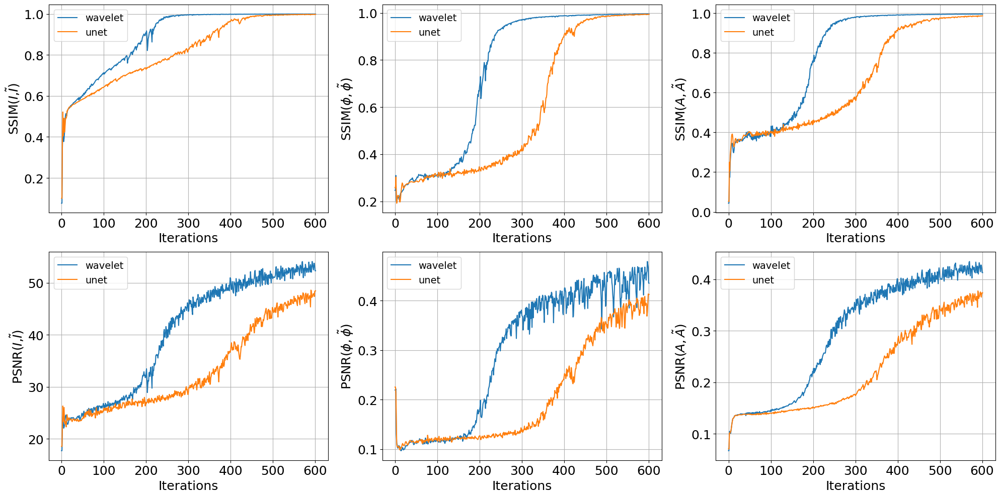

In [4]:
import matplotlib.pyplot as plt

keys = ['SSIM(${I}$,$\\tilde{I}$)', 'SSIM($\\phi,\\tilde{\\phi}$)', 'SSIM($A,\\tilde{A}$)', 'PSNR(${I}$,$\\tilde{I}$)', 'PSNR($\\phi,\\tilde{\\phi}$)', 'PSNR($A,\\tilde{A}$)']

fig, ax = plt.subplots(2, 3, figsize=(20, 10))
rows, cols = 2, 3
for i in range(2):
    for j in range(3):
        ax[i, j].plot(comparison[0][i*cols+j], label='wavelet')
        ax[i, j].plot(comparison[1][i*cols+j], label='unet')
        ax[i, j].legend(prop={'size': 14})
        # ax[i, j].set_title(keys[i*cols+j], fontsize=20)
        ax[i, j].set_xlabel('Iterations', fontsize=18)
        ax[i, j].set_ylabel(keys[i*cols+j], fontsize=18)
        ax[i, j].grid()
        ax[i, j].tick_params(axis='both', which='major', labelsize=18)
plt.tight_layout()
plt.show()


In [3]:
phase_list = resize_with_diff_interpolation(model.phase_list, (256, 256))
att_list = resize_with_diff_interpolation(model.attenuation_list, (256, 256))

create_gif_with_progress_profile_text([phase_list[i] for i in range(100,300)], 'data/images/qr_phase.gif', duration = 5.5, loop = 0, add_profile = False)
create_gif_with_progress_profile_text([att_list[i] for i in range(100,300)], 'data/images/qr_att.gif', duration = 5.5, loop = 0, add_profile = False)

In [16]:
(att_list[0].shape)

(128, 128)

In [ ]:
from visualize import *
from model_foundations import *
from unet import *
from comparison import *
from fresnel_propagator import *
from info import *
from gauss_conv import *
from IPython.display import display
from torch import optim

class solver(nn.Module):
    # @profile
    def __init__(self, **kwargs):
        super(solver, self).__init__()
        
        self.basic_setup = join_dict(kwargs, json_file)
        self.basic_setup =(prepare_dict(**self.basic_setup))
        
        if 'ground_transform_type' not in self.basic_setup.keys():
            self.basic_setup['ground_transform_type'] = self.basic_setup['transform_type']
        
        if 'ground_atten_transform_type' not in self.basic_setup.keys():
            self.basic_setup['ground_atten_transform_type'] = self.basic_setup['transform_type']
        
        for key, value in self.basic_setup.items():
            setattr(self, key, value)

        if 'add_noise' in kwargs.keys() and kwargs['add_noise']:
            self.add_noise = False
            self.best_noise = None
            self.no_of_noises = 1 if 'no_of_noises' not in kwargs.keys() else kwargs['no_of_noises']

        if 'ground_truth' in self.__dict__.keys() and self.ground_truth is not None:
            self.ground_truth = transform(self.ground_truth, 'reshape')
            self.ground_truth = to_device(self.ground_truth, self.device)
        
        if 'ground_attenuation' in kwargs.keys() and kwargs['ground_attenuation'] is not None:
            self.ground_attenuation = torch.exp(-1*transform(kwargs['ground_attenuation'], 'reshape'))
            self.ground_attenuation = to_device(resize_with_diff_interpolation(self.ground_attenuation, (self.shape_x, self.shape_y), out_type = 'Tensor'), self.device)

        if self.image is None:
            if self.phase is not None and self.attenuation is not None:
                self.image = Fresnel_propagation(**self.__dict__).forward(self.phase, self.attenuation)
        self.mean = torch.mean(self.image)
        self.std = torch.std(self.image)
        self.transformed_images = transform(self.image, self.transform_type, self.transform_factor)
        # print(self.image.shape, self.transformed_images.shape, '(min, max) => ',self.transformed_images.min(), self.transformed_images.max())
        self.transformed_images = to_device(self.transformed_images, self.device)
        self.noise_approximations = []
        self.create_seed()
        self.make_model()
        self.define_task(**kwargs)
        self.criterion(**kwargs)
        self.easy_transformed_images()
        
    def create_seed(self, seed = None):
        if seed is None:
            seed = self.seed
        random.seed(seed)
        torch.manual_seed(seed)
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)
        np.random.seed(seed)
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = True

    def generator(self, **kwargs):
        ##################################################################################################
        # We first define the generator model
        ##################################################################################################
        options = {'fc_depth': 0, 'units': 48, 'depth':3, 'cnn_depth': 0, 'conv_num': 32, 'conv_size': 3, 'dropout': 0.25, 'apply_batchnorm': True, 'normal_init': True, 'device': 'cuda:0'}
        options.update(self.__dict__)
        [setattr(self, key, value) for key, value in options.items()]

        self.output_size = (self.shape_x, self.shape_y)

        if self.fc_depth == 0:
            self.fc_stack = []
        else:
            units = [self.units]*self.fc_depth
            self.fc_submodule = nn.ModuleList([
                dense_layer(in_features=self.units, out_features=self.units, dropout=self.dropout) for i in range(len(units))
            ])
            self.fc_stack = nn.ModuleList([
                nn.Flatten(),
                Transpose(),
                dense_layer(in_features=1, out_features=self.units, dropout=self.dropout, transpose=False),
                *self.fc_submodule,
                dense_layer(in_features=self.units, out_features=1, dropout=0),
                Reshape((-1, 1, self.output_size[0], self.output_size[1])),
            ])

        if self.cnn_depth == 0:
            self.cnn_stack = []
        else:
            conv_size_add_list = list(np.arange(1,self.cnn_depth+1))
            deconv_size_add_list = list(np.arange(self.cnn_depth, 0, -1))
            self.conv_stack = nn.ModuleList([
                conv2d_layer(in_channels=self.conv_num, out_channels=self.conv_num, kernel_size=self.conv_size+conv_size_add_list[i], stride=1, apply_batchnorm=True, normal_init=True) for i in range(len(conv_size_add_list))
            ])

            self.dconv_stack = nn.ModuleList([
                deconv2d_layer(in_channels=self.conv_num, out_channels=self.conv_num, kernel_size=self.conv_size+deconv_size_add_list[i], stride=1, apply_batchnorm=True, normal_init=True) for i in range(len(deconv_size_add_list))
            ])
            self.cnn_stack = nn.ModuleList([      
                conv2d_layer(in_channels=1, out_channels=self.conv_num, kernel_size=self.conv_size, stride=1), 
                *self.conv_stack[0:],
                *self.dconv_stack,
                deconv2d_layer(in_channels=self.conv_num, out_channels=self.output_num, kernel_size=self.conv_size, stride=1),
            ])
        
        if self.depth == 0:
            self.generator_model = to_device(nn.Sequential(
                *self.fc_stack,
                *self.cnn_stack,
            ), self.device)
        else:
            if self.model_type == 'unet':
                self.generator_model = to_device(UNet(n_channels=self.input_channels, n_classes=self.output_num, bilinear=True, use_checkpoint=self.use_checkpoint, base=self.base), self.device)
            elif self.model_type == 'wavelet':
                self.generator_model = to_device(Wavelet_UNet(n_channels=self.input_channels, n_classes=self.output_num, wavelet=self.wavelet, base = self.base), self.device)
            elif self.model_type == 'unet2':
                self.generator_model = to_device( UNET(n_channels=self.input_channels, out_channels=self.output_num), self.device)

            elif self.model_type == 'fc':
                self.generator_model = self.generator(fc_depth = 3, units = 32, depth = 3, cnn_depth = 4, conv_num = self.conv_num, conv_size = 3, dropout = 0.25, apply_batchnorm = True, normal_init = True, device = self.device)

        if self.second_model:
            self.generator_model2 = to_device(nn.Sequential(*self.fc_stack, UNet(n_channels=self.input_channels, n_classes=self.output_num, bilinear=True)), self.device)
        else:
            self.generator_model2 = None
        if 'init_model' in kwargs.keys():
            if kwargs['init_model']:
                # Load the model
                if 'init_model_path' in kwargs.keys():
                    init_model_path = kwargs['init_model_path']
                else:
                    init_model_path = kwargs['save_model_path']
                old_gen = torch.load(init_model_path + 'generator.pth')
                self.generator_model.load_state_dict(old_gen.state_dict())
        if self.second_model:
            if 'init_model2_path' in self.__dict__.keys():
                old_gen2 = torch.load(self.init_model2_path + 'generator2.pth')
                self.generator_model2.load_state_dict(old_gen2.state_dict())
        else:
            self.init_weights()

    def discriminator(self, **kwargs):
        # ##################################################################################################
        # # We then define the discriminator model
        # ##################################################################################################      
        self.init_model_path = self.__dict__.get('init_model_path', None)
        self.save_model_path = self.__dict__.get('save_model_path', None)
        if self.dis_type == None:
            self.dis_depth = 0
        if self.dis_depth == 0: 
            self.discriminator_model = None
        else:
            from discriminator_factory import DiscriminatorFactory as DF
            self.discriminator_model = DF(input_channels=self.input_channels, dis_type=self.dis_type, dis_depth=self.dis_depth, conv_num=self.conv_num, device=self.device, init_model = self.init_model, init_model_path = self.init_model_path, save_model_path = self.save_model_path)
                  
    def init_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
                init.xavier_uniform_(m.weight)
                if m.bias is not None:
                    init.zeros_(m.bias)
            if isinstance(m, nn.Linear):
                init.xavier_uniform_(m.weight)
                if m.bias is not None:
                    init.zeros_(m.bias)
            if isinstance(m, nn.BatchNorm2d):
                init.ones_(m.weight)
                init.zeros_(m.bias)

    def define_task(self, task = None, **kwargs):
        self.pad_times = 1 if 'pad_times' not in self.__dict__.keys() else self.pad_times
        self.phase, self.orig_shapes = pad_multiple_times(self.phase, self.pad_times, self.pad)
        self.attenuation = pad_multiple_times(self.attenuation, self.pad_times, self.pad)[0]
        if type(self.abs_ratio) is list:
            assert len(self.abs_ratio) == self.transformed_images.shape[0] # or len(self.abs_ratio) == self.output_num - 1
            abs_reshaped = np.array(self.abs_ratio)
            self.abs_ratio = to_device(torch_reshape(abs_reshaped[:,None,None,None]),self.device)

        self.fresnel_propagator =Fresnel_propagation(**self.__dict__)
        self.fresnel_factor = to_device(self.fresnel_propagator.fresnel_factor, self.device)
        self.base_matrix = to_device(self.fresnel_propagator.base_matrix, self.device)

        self.refine_param = False if 'refine_param' not in self.__dict__.keys() else self.refine_param
        if self.refine_param:
            self.fresnel_numbers = np.random.normal(self.fresnel_number, self.fresnel_number/10, 5)
            #make sure the fresnel number is positive
            self.fresnel_numbers = [abs(f) for f in self.fresnel_numbers]
            self.fresnel_numbers = list(self.fresnel_numbers)
            dict_copy = self.__dict__.copy()
            self.fresnel_factors = []
            for i, f in enumerate(self.fresnel_numbers):
                dict_copy['fresnel_number'] = f
                self.fresnel_factors.append(to_device(Fresnel_propagation(**dict_copy).fresnel_factor, self.device))
        else:
            self.fresnel_numbers = [self.fresnel_number]
            self.fresnel_factors = [self.fresnel_factor]
                
    def criterion(self, **kwargs):
        self.ssim = to_device(SSIM(), self.device)
        self.psnr = to_device(PSNR(), self.device)
        self.mssim = to_device(mSSIM(), self.device)
        # self.fid.update(self.transformed_images, real=True)
        
    def easy_transformed_images(self, image = None):
        image = self.transformed_images if image is None else image
        self.reshaped = to_device(transform(image, 'reshape') , self.device)
        self.normalized = transform(self.reshaped, 'normalize')
        self.norm = transform(self.reshaped, 'norm')
    
    def init_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
                init.xavier_uniform_(m.weight)
                if m.bias is not None:
                    init.zeros_(m.bias)
            if isinstance(m, nn.Linear):
                init.xavier_uniform_(m.weight)
                if m.bias is not None:
                    init.zeros_(m.bias)
            if isinstance(m, nn.BatchNorm2d):
                init.ones_(m.weight)
                init.zeros_(m.bias)

    def best_noise_approximation(self, propagated_intensity, noise_type = 'poisson', **kwargs):
        #we use the best noise approximation
        noisy_image = []
        differences = []
        diff_prop_noisy = []
        bayesian = []
        if self.no_of_noises > 0:
            for i in range(self.no_of_noises):
                if noise_type == 'poisson':
                    noisy_image.append(self.transform(torch_noise_poisson(propagated_intensity, self.noise_factor, torch.Generator(device='cuda').manual_seed(self.seed))))
                elif noise_type == 'gaussian':
                    noisy_image.append(self.transform(torch_noise_gaussian(propagated_intensity, std = self.noise_factor)))
                elif noise_type == 'speckle':
                    noisy_image.append(self.transform(torch_noise_speckle(propagated_intensity, std = self.noise_factor)))
                    
                diff_prop_noisy.append(noisy_image[i] - self.transformed_images)
                differences.append(torch.mean(torch.abs(noisy_image[i] - self.transformed_images)))
                #bayesian approach using the difference using exponential distribution
                bayesian.append(torch.exp(-differences[i]))

        propagated_intensity = noisy_image[bayesian.index(max(bayesian))]
        self.difference = torch.mean(torch.stack(diff_prop_noisy), dim = 0)
        return propagated_intensity
    
    def make_model(self):
        self.generator(**self.__dict__)
        self.discriminator(**self.__dict__)
        self.g_learning_rate = self.__dict__.get('g_learning_rate', 1e-3)
        self.d_learning_rate = self.__dict__.get('d_learning_rate', 1e-4)
        self.weight_decay = self.__dict__.get('weight_decay', 1e-8)
        self.momentum = self.__dict__.get('momentum', 0.9)
        self.amp = self.__dict__.get('amp', False)
        self.scheduler_type = self.__dict__.get('scheduler_type', 'cosine')
        self.generator_optimizer = None
        self.generator_optimizer2 = None
        self.discriminator_optimizer = None
        self.scheduler = None
        self.scheduler2 = None

        if hasattr(self, 'generator_model') and self.generator_model is not None:
            self.generator_optimizer = optim.Adam(self.generator_model.parameters(),lr=self.g_learning_rate, weight_decay=self.weight_decay)
        else:
            print("Warning: self.generator_model not found or is None. Optimizer for generator_model not created.")

        if self.second_model and hasattr(self, 'generator_model2') and self.generator_model2 is not None:
            self.generator_optimizer2 = optim.Adam(self.generator_model2.parameters(),lr=self.g_learning_rate, weight_decay=self.weight_decay)
        elif self.second_model:
            print("Warning: self.second_model is True, but self.generator_model2 not found or is None. Optimizer for generator_model2 not created.")

        if self.dis_depth > 0 and hasattr(self, 'discriminator_model') and self.discriminator_model is not None:
            self.discriminator_optimizer = optim.Adam(self.discriminator_model.parameters(), lr=self.d_learning_rate, weight_decay=self.weight_decay, amsgrad=True, maximize=True)
        elif self.dis_depth > 0:
            print("Warning: self.dis_depth > 0, but self.discriminator_model not found or is None. Optimizer for discriminator_model not created.")
            
        if self.generator_optimizer is not None: # Only create scheduler if optimizer exists
            
            if self.scheduler_type == 'plateau':
                    self.scheduler = optim.lr_scheduler.ReduceLROnPlateau(self.generator_optimizer, 'min', patience=5)
            elif self.scheduler_type == 'step':
                    self.scheduler = optim.lr_scheduler.StepLR(self.generator_optimizer, step_size=max(1, self.iter_num//50), gamma=0.1) # Ensure step_size is at least 1
            elif self.scheduler_type == 'cosine':
                    # iter_num should be set before make_model is called if used here.
                    # train sets self.iter_nums = self.iter_num. Assuming self.iter_num is the intended total iterations.
                    self.scheduler = optim.lr_scheduler.CosineAnnealingLR(self.generator_optimizer, T_max=self.iter_num//50, eta_min=5e-4)
            elif self.scheduler_type == 'one_cycle':
                    # OneCycleLR's steps_per_epoch and epochs might need careful alignment with iter_num
                    # Assuming iter_num is total steps, then steps_per_epoch=1 and epochs=iter_num could work
                    self.scheduler = optim.lr_scheduler.OneCycleLR(self.generator_optimizer, max_lr=self.g_learning_rate, total_steps=self.iter_num)
            elif self.scheduler_type == 'exp':
                    self.scheduler = optim.lr_scheduler.ExponentialLR(self.generator_optimizer, gamma=0.95) # Adjusted gamma for smoother decay
            elif self.scheduler_type == 'none':
                    self.scheduler = None # Explicitly None
            else:
                self.scheduler = None # Ensure scheduler is None if optimizer wasn't created
        
        if self.second_model and self.generator_optimizer2 is not None: # Only create scheduler2 if optimizer2 exists
            if self.scheduler_type == 'cosine': # Apply cosine to second model as well
                self.scheduler2 = optim.lr_scheduler.CosineAnnealingLR(self.generator_optimizer2, T_max=self.iter_num, eta_min=1e-4)
            elif self.scheduler_type == 'exp': # Fallback or specific choice for second model
                self.scheduler2 = optim.lr_scheduler.ExponentialLR(self.generator_optimizer2, gamma=0.95)
            # Add other types for scheduler2 if needed, or make it always follow self.scheduler_type
            else: # Default to None or a simple scheduler if type not matched for scheduler2
                self.scheduler2 = None
        else:
            self.scheduler2 = None # Ensure scheduler2 is None
            
        self.grad_scaler = torch.amp.GradScaler('cuda', enabled=self.amp)
       
    def transform(self, x):
        if 'transform_type' in self.__dict__.keys():
            transform_type = self.transform_type
        else:
            transform_type = 'reshape'

        if 'transform_factor' in self.__dict__.keys():
            transform_factor = self.transform_factor
        else:
            transform_factor = 0.1
        return transform(x, transform_type, transform_factor)

    def propagator(self):
        # self.phase = transform(self.pred[:,0,:,:], self.ground_transform_type)
        # self.attenuation = transform(self.pred[:,1,:,:], self.ground_atten_transform_type)
        self.phase = pos_neg_image(self.pred[:,0,:,:], self.positive_phase) if 'positive_phase' in self.__dict__.keys() else torch_reshape(self.pred[:,0,:,:])
        self.attenuation = pos_neg_image(self.pred[:,1,:,:], self.positive_attenuation) if 'positive_attenuation' in self.__dict__.keys() else torch_reshape(self.pred[:,1,:,:])
        self.attenuation = self.attenuation*self.abs_ratio
        self.propagated_intensity = pos_neg_image(self.fresnel_propagator.forward(pad_multiple_times(self.phase, self.pad_times, self.pad)[0], pad_multiple_times(self.attenuation, self.pad_times, self.pad)[0], fresnel_factor = self.fresnel_factor, base_coeff = self.base_matrix,), self.transform_type)
        self.propagated_intensity = unpad_multiple_times(self.propagated_intensity, self.pad_times, self.orig_shapes)
        self.propagated_intensity = resize_with_diff_interpolation(self.transform(self.propagated_intensity), (self.shape_x, self.shape_y), out_type = 'Tensor')
        # self.propagated_intensity = self.best_noise_approximation(self.propagated_intensity) if self.add_noise else None
        self.difference = self.propagated_intensity - self.transformed_images #if not self.add_noise else None

        self.possible_propagation_with_more_fresnel_numbers = []
        if self.dis_depth == 1:
            self.possible_propagation_with_more_fresnel_numbers  = [self.fresnel_propagator.forward(self.phase, self.attenuation, fresnel_factor = self.fresnel_factors[i], base_coeff = self.base_matrix) for i in range(len(self.fresnel_factors))]
        
        if self.loss_box_number == 1:
            # hide the center part of the image for the self.difference
            #width
            width = self.shape_x//self.loss_box_size_factor + 1
            #height
            height = self.shape_y//self.loss_box_size_factor + 1
            #select a random center between edge - width//2 and edge + width//2
            center = (random.randint(width//2, self.shape_x - width//2), random.randint(height//2, self.shape_y - height//2))
            box_x = center[0] - width//2
            box_y = center[1] - height//2
            hallow_propagated_intensity = self.propagated_intensity.clone()
            hallow_propagated_intensity[box_x:box_x+width, box_y:box_y+height] = 0
            self.difference = hallow_propagated_intensity - self.transformed_images
            
        elif self.loss_box_number > 1:
            for i in range(self.loss_box_number):
                # hide the center part of the image for the self.difference
                #width
                width = self.shape_x//self.loss_box_size_factor + 1
                #height
                height = self.shape_y//self.loss_box_size_factor + 1
                #select a random center between edge - width//2 and edge + width//2
                center = (random.randint(width//2, self.shape_x - width//2), random.randint(height//2, self.shape_y - height//2))
                box_x = center[0] - width//2
                box_y = center[1] - height//2
                hallow_propagated_intensity = self.propagated_intensity.clone()
                hallow_propagated_intensity[box_x:box_x+width, box_y:box_y+height] = 0
                self.difference += hallow_propagated_intensity - self.transformed_images
                
        if self.l1_ratio != 0:
            self.main_diff = torch.mean(torch.abs(self.difference))
        else:
            self.main_diff = torch.mean(torch.square(self.difference)) + self.phase_diff + self.attenuation_diff

        return self.propagated_intensity, self.phase, self.attenuation
    
    def forward(self, x = None):
        x = self.transformed_images if x is None else x
        self.pred = self.generator_model(x)
        propagated_intensity, phase, attenuation = self.propagator()
        if self.second_model:
            self.target_phase = self.phase
            self.target_attenuation = self.attenuation
            self.target = torch.cat((self.target_phase, self.target_attenuation), 1)
            self.pred2 = self.generator_model2(self.propagated_intensity)
            self.generator2_loss = torch.mean(torch.abs(self.target - self.pred2))
        
        self.fake_output = self.discriminator_model(propagated_intensity) if self.dis_depth > 0 else None
        # self.fake_outputs = [self.discriminator_model(prop) for prop in self.possible_propagation_with_more_fresnel_numbers] if 'possible_propagation_with_more_fresnel_numbers' in self.__dict__.keys() else None

        self.real_output = self.discriminator_model(x) if self.dis_depth > 0 else None
        return self.fake_output, self.real_output, propagated_intensity, phase, attenuation
    
    def generator_loss(self, fake_output, x, propagated_intensity):
        cross_entropy = torch.mean(torch.nn.BCEWithLogitsLoss()(fake_output, torch.ones_like(fake_output))) if self.dis_depth > 0 else 0
        if self.dis_depth == 1 and self.epoch >self.iter_nums//2:  
                i_random = random.randint(0, len(self.fresnel_factors)-1)
                fresnel_factor = self.fresnel_factors[i_random]
                another_prop = self.possible_propagation_with_more_fresnel_numbers[i_random]       
                self.phases, self.phase_diff = self.forward_different(another_prop, fresnel_factor)
                self.main_diff = self.main_diff + 0.005* self.phase_diff
                
        if self.l1_ratio == 0:
            l2_loss = self.main_diff if self.l2_ratio != 0 else 0
            l1_loss = 0
        else:
            l1_loss =self.main_diff if self.l1_ratio != 0 else 0
            l2_loss = torch.mean(torch.square(self.difference)) if self.l2_ratio != 0 else 0
 
        self.final_loss =  self.entropy_ratio * cross_entropy + self.l1_ratio * l1_loss + self.l2_ratio * l2_loss
        return self.final_loss
        
    def discriminator_loss(self, real_output, fake_output):
        real_loss = torch.mean(torch.nn.BCEWithLogitsLoss()(real_output, torch.ones_like(real_output)))
        fake_loss = torch.mean(torch.nn.BCEWithLogitsLoss()(fake_output, torch.zeros_like(fake_output)))
        fake_losses = [torch.mean(torch.nn.BCEWithLogitsLoss()(fake, torch.zeros_like(fake))) for fake in self.fake_outputs] if 'fake_outputs' in self.__dict__.keys() else [torch.tensor(0).to(self.device)]
        self.total_loss = self.real_loss_ratio * real_loss + self.fake_loss_ratio * fake_loss + sum(fake_losses) if self.dis_depth > 0 else real_loss
        return self.total_loss
    
    def train_step(self, x):
        self.generator_optimizer.zero_grad()
        self.generator_optimizer2.zero_grad() if self.second_model else None
        self.discriminator_optimizer.zero_grad() if self.dis_depth > 0 else None
        self.fake_output, self.real_output, self.propagated_intensity, self.phase, self.attenuation = self.forward(x)
            
        self.gen_loss = self.generator_loss(self.fake_output, x, self.propagated_intensity)
        self.gen2_loss = self.generator2_loss if self.second_model else None
        self.dis_loss = self.discriminator_loss(self.real_output, self.fake_output.detach()) if self.dis_depth > 0 else torch.tensor(0).to(self.device)


        self.dis_loss.backward(retain_graph=True) if self.dis_depth > 0 else None
        self.gen2_loss.backward(retain_graph=True) if self.second_model else None
        self.gen_loss.backward()
        
        self.generator_optimizer.step()
        self.generator_optimizer2.step() if self.second_model else None
        self.discriminator_optimizer.step() if self.dis_depth > 0 else None
        return self.gen_loss, self.dis_loss, self.propagated_intensity, self.phase, self.attenuation
    
    def train(self, condition = None, value = None, **kwargs): # l1_ratio = 10, l2_ratio = 0, fourier_ratio = 0):
        
        for key, value in kwargs.items():
            setattr(self, key, value)
        if condition is not None and value is not None:
            self.__dict__[condition] = value if type(value) is not list else self.__dict__[condition]
        self.gen2_losses = []
        self.iter_nums = self.iter_num
        self.metrics(task = 'initialize')
        self.rectangle = 'whole' # 'whole', 'center left', 'center right'
        self.stop_training = False
        self.total_time = 0
        from tqdm import tqdm as tq
        pbar = tq(range(self.iter_num), desc=f"Stage {self.shape[0]}  LR  score") if self.use_tqdm else range(self.iter_num)
        
        for i in pbar if self.use_tqdm else range(self.iter_num):
            self.epoch = i
            timer_starts = time.time()
            self.g_loss, self.d_loss, self.propagated_intensity, self.phase, self.attenuation = self.train_step(self.transformed_images)
            self.phase_list.append(tensor_to_np(self.phase))if self.append_all else None
            self.attenuation = torch.exp(-1*self.attenuation)
            self.attenuation_list.append(tensor_to_np(self.attenuation))if self.append_all else None
            
            self.propagated_intensity_list.append(tensor_to_np(self.propagated_intensity)) if self.append_all else None
        
            if not self.append_all:
                self.phase_list = [tensor_to_np(self.phase)]
                self.attenuation_list = [tensor_to_np(self.attenuation)]
                self.propagated_intensity_list =[tensor_to_np(self.propagated_intensity)]    
            
            self.epoch_time.append(time.time() - timer_starts)
            self.metrics('all', task = 'update', rectangle = self.rectangle) if self.append_all else None
            if self.use_tqdm:
                if self.ground_truth is not None:
                    if self.ground_attenuation is not None:
                        pbar.set_postfix(ssim=f"{self.ssim_list[-1]:.3f}", psnr=f"{self.psnr_list[-1]:.3f}", phase_ssim = f"{self.ground_ssim_list[-1]:.3f}", attenuation_ssim = f"{self.ground_att_ssim_list[-1]:.3f}")
                    else:
                        pbar.set_postfix(ssim=f"{self.ssim_list[-1]:.3f}", psnr=f"{self.psnr_list[-1]:.3f}", phase_ssim = f"{self.ground_ssim_list[-1]:.3f}",)
                else:
                    pbar.set_postfix(ssim=f"{self.ssim_list[-1]:.3f}", psnr=f"{self.psnr_list[-1]:.3f}",)
            
            if  self.update_rate:
                # self.metrics('all', task = 'update', rectangle = self.rectangle) if not self.append_all else None    
                if i ==0 or (i+1) % (self.iter_nums//self.update_rate) == 0 or self.stop_training is True:
                    self.metrics('all', task = 'update', rectangle = self.rectangle) 
                    if self.ground_truth is None:
                        print('epoch', i, 'main_diff: ', tensor_to_np(self.main_diff), "t_epoch: ", self.epoch_time[-1], 'ssim: ', self.ssim_list[-1], 'psnr: ', self.psnr_list[-1], 'remaining time: ', time_to_string(self.epoch_time[-1] * self.iter_nums - self.epoch_time[-1] * i), 'gen_loss: ', tensor_to_np(self.g_loss), 'dis_loss: ', tensor_to_np(self.d_loss)) if self.print_result else None
                    elif self.ground_attenuation is None:
                        print('epoch', i, 'main_diff: ', tensor_to_np(self.main_diff), "t_epoch: ", self.epoch_time[-1], "remaining time: ", time_to_string(self.epoch_time[-1] * self.iter_nums - self.epoch_time[-1] * i), 'ssim: ', self.ssim_list[-1], 'psnr: ', self.psnr_list[-1], 'ground_ssim: ', self.ground_ssim_list[-1], 'ground_psnr: ', self.ground_psnr_list[-1], 'gen_loss: ', tensor_to_np(self.g_loss), 'dis_loss: ', tensor_to_np(self.d_loss), ) if self.print_result else None
                    else:
                        print('epoch', i, 'main_diff: ', tensor_to_np(self.main_diff), "t_epoch: ", self.epoch_time[-1], "remaining time: ", time_to_string(self.epoch_time[-1] * self.iter_nums - self.epoch_time[-1] * i), 'ssim: ', self.ssim_list[-1], 'psnr: ', self.psnr_list[-1], 'ground_ssim: ', self.ground_ssim_list[-1], 'ground_psnr: ', self.ground_psnr_list[-1], 'A_SSIM: ', self.ground_att_ssim_list[-1], 'A_PSNR: ', self.ground_att_psnr_list[-1], 'A_L1: ', self.ground_att_main_diff_list[-1], 'gen_loss: ', tensor_to_np(self.g_loss), 'dis_loss: ', tensor_to_np(self.d_loss), ) if self.print_result else None
                if self.stop_training is True:
                    break                
                self.update_pandas(condition = condition)
            
            if self.stop_training is True:
                break
        if self.second_model:
            #save the second model
            torch.save(self.generator_model2, self.save_path + 'generator2.pth')

            
    def sequential_train(self, name, save_images = True, visualize_results = False, ground_self = True, **kwargs):
        ground_model = None if ground_self else 'updated'
        dfs, names, = [], []
        final_phases, final_absorptions, final_propagations = [], [], []
        info = self.basic_setup.copy()
        info = join_dict(kwargs, info)
        info['downsampling_factor'] = 1
        info['downsampling_factors'] = [2**2, 2**1, 2**0] if 'downsampling_factors' not in info.keys() else info['downsampling_factors']
        iter_nums = [1, 3, 7] if 'iter_nums' not in info.keys() else info['iter_nums']
        iter_factor = 1 if 'iter_factor' not in info.keys() else info['iter_factor']
        main_name = name
        
        if type(info['path']) is list:
            N = len(info['path'])  
        else:          
            N = info['path'].shape[0] if len(info['path'].shape) > 2 else 1
        
        from tqdm import tqdm as tq
        for iter, d in tq(zip(iter_nums, info['downsampling_factors'])):
            info['downsampling_factor'] = d
            info['iter_num'] = iter * iter_factor

            try:
                model = solver(**info)
                
                # print('orig shape', info['image'].shape, 'image shape: ', model.transformed_images.shape, 'fresnel_factor shape: ', model.fresnel_factor.shape, 'base_matrix shape: ', model.base_matrix.shape, 'fresnel_number: ', model.fresnel_number, 'downsampling_factor: ', model.downsampling_factor, d)
                if ground_model is not None:
                    # print('transfer learning')
                    model.generator_model.load_state_dict(self.generator_model.state_dict())
                    model.discriminator_model.load_state_dict(self.discriminator_model.state_dict()) if model.dis_depth > 0 else None
                # model.diffuse_train(3)
                model.train(use_tqdm = self.use_tqdm)
                ground_model = 'updated'
                self.__dict__ = model.__dict__
                del model
                ### Let's update the results
                df = self.df.iloc[-1]
                df = df.copy()
                df['df'] = d
                df['abs'] = np.array(info['abs_ratio'])
                if self.use_diffusion:
                    df['depth'] = info['dis_depth']
                df['epoch_time'] = [np.round(self.epoch_time[0],4), np.round(self.epoch_time[-1],4)]
                
                if 'condition' in kwargs.keys():
                    if type(kwargs['condition']) is not list:
                        kwargs['condition'] = [kwargs['condition']]
                    for condition in kwargs['condition']:
                        df[condition] = self.__dict__[condition]
                        
                dfs.append(df)
                
                # model_spider.visualize(show_or_plot='both', zoomout_location = 'custom', cmap='gray', position = 'middle right', min_max = True, colorbar = True)#, save_path = '/home/hailudaw/hailudaw/git_folders/Gans4Inverse/paper_results', save_name = 'bone_screw')
                final_phases.append(self.phase_list[-1])
                final_absorptions.append(self.attenuation_list[-1])
                final_propagations.append(self.propagated_intensity_list[-1])
                if N == 1:
                    names.append(name + '\ndf: '+str(int(info['downsampling_factor'])))
                else:
                    names.append([name + '\ndf: '+str(int(info['downsampling_factor'])) + ' ' + str(i) for i in range(N)])
                
            except:
                continue
        if 'ground_attenuation' in self.__dict__.keys() and self.ground_attenuation is not None:
            final_phases.append(tensor_to_np(self.ground_truth))
            final_absorptions.append(tensor_to_np(self.ground_attenuation))
        else:
            if 'ground_truth' in self.__dict__.keys() and self.ground_truth is not None:
                final_phases.append(tensor_to_np(self.ground_truth))
                names.append(name + '\nSimulation')
            else:
                final_phases.append(tensor_to_np(self.transformed_images))
                names.append(name + '\nInput Hologram')
        self.names = names
        
        if save_images:
            self.experiment_name = name #if 'experiment_name' not in kwargs.keys() else kwargs['experiment_name']
            if 'image_path' not in self.__dict__.keys() or self.image_path is None:
                name = name if 'name' not in kwargs.keys() else kwargs['name']
                name = name + '_' + str(self.abs_ratio)
                name = [name] if self.phase.shape[0] > 1 else [name + str(i).fill(4) for i in range(len(self.phase))]
            else:
                name = self.image_path.split('/')[-1].split('.')[0] if type(self.image_path) is str else [img_path.split('/')[-1].split('.')[0] for img_path in self.image_path]
                name = [na + '_' + str(self.abs_ratio) for na in name] if type(name) is list else [name + '_' + str(self.abs_ratio)]
            self.name = name
            if 'save_path' in self.__dict__.keys():
                path = self.save_path  
            else:
                path = '/home/hailudaw/hailudaw/git_folders/Gans4Inverse/paper_results/'
            path = path + self.experiment_name+'/'
            phase_path = path + 'phase/'
            attenuation_path = path + 'abs/'
            propagation_path = path + 'propagation/'
            csv_path = path + 'csv/'
            os.makedirs(path) if not os.path.exists(path) else None
            os.makedirs(phase_path) if not os.path.exists(phase_path) else None
            os.makedirs(attenuation_path) if not os.path.exists(attenuation_path) else None
            os.makedirs(propagation_path) if not os.path.exists(propagation_path) else None
            os.makedirs(csv_path) if not os.path.exists(csv_path) else None
            
            if len(name) > 1:
                # [print("save to 0 ",  phase_path + name[i]) for i in range(len(name))]
                [io.imsave(phase_path + name[i] + '.tif', tensor_to_np(self.phase[i])) for i in range(len(name))]
                [io.imsave(attenuation_path + name[i] + '.tif', tensor_to_np((self.attenuation[i]))) for i in range(len(name))]
                
            else:
                # print("saved to 1 ", phase_path + name[0])
                io.imsave(phase_path + name[0] + '.tif', tensor_to_np(self.phase))# final_phases[-2])
                io.imsave(attenuation_path + name[0] + '.tif', tensor_to_np(self.attenuation))# final_absorptions[-2])
                # [io.imsave(final_propagations[-2][i], propagation_path + name[i] + '.tif') for i in range(len(final_propagations)-1)] if type(final_propagations[0]) is list else io.imsave(final_propagations[-2], propagation_path + name + '.tif')
                
            torch.save(self.generator_model, path +  main_name + '_generator.pth')
            torch.save(self.discriminator_model, path +  main_name +'_discriminator.pth')
            
        all_dfs = []
        for i, df in enumerate(dfs):
            #last row
            df = df.to_frame().T
            all_dfs.append(df)
            #index name to iter_num
            df.index.name = 'iter_num'
        if len(all_dfs) > 1:
            all_dfs = pd.concat(all_dfs, axis = 0)
            self.ssim_last = self.ssim_list[-1] 
            self.psnr_last = self.psnr_list[-1]
            self.all_dfs = all_dfs
            if save_images:
                all_dfs.to_csv(csv_path +  name[0] +'_stacked_'+str(len(name))+ '.csv')
        # display(all_dfs)
        self.phase_list = final_phases
        self.attenuation_list = final_absorptions
        self.propagated_intensity_list = final_propagations

        if visualize_results:
            #  sa_wspace = 0.4, sa_hspace = 0.2, colorbar_normalize = False, shrink = 0.5, colorbar_location='bottom', alpha = alpha, title_color = 'black', pad =-0.001, show_or_plot = 'zoom', images_per_row =3, axis = 'off', plot3_axis='half', zoomout_location='obr', colorbar = True, min_max=False, fontsize = 33, cmap = cmap, label_size = 40, colorbar_size_factor=100, legend_location = 'right', second_title = 'no_title', second_title_color= 'w', second_title_fontsize=34, title_x = 0.5, title_y = 1, second_title_y = 0.05, title_horizontalalignment = 'center', position = 'custom')
            vis_kwargs = {'fig_size': (50, 15), 'sa_wspace': 0.01, 'sa_hspace': 0.01, 'colorbar_normalize': False, 'shrink': 0.5, 'colorbar_location': 'right', 'title_color': 'black', 'pad': -0.001, 'show_or_plot': 'both', 'images_per_row': len(final_phases)+1, 'axis': 'off', 'plot_axis': 'half', 'zoomout_location': 'top left', 'colorbar': True, 'min_max': False, 'fontsize': 33, 'cmap': 'gray', 'label_size': 40, 'colorbar_size_factor': 100, 'legend_location': 'right', 'second_title': 'no_title', 'second_title_color': 'w', 'second_title_fontsize': 34, 'title_x': 0.5, 'title_y': 1, 'second_title_y': 0.05, 'title_horizontalalignment': 'center', 'position': 'middle right'}
            for key, value in vis_kwargs.items():
                if key not in kwargs.keys():
                    kwargs[key] = value
            visualize(final_phases, title = names, **kwargs)
            kwargs['cmp'] = 'gray_r'
            visualize(final_absorptions, title = names, **kwargs)
            # visualize(final_propagations,title = names, **kwargs)
            
        # ground_model = None
        return all_dfs, final_phases, final_absorptions , final_propagations, self.names

    def metrics(self, property = 'ssim', task = 'update', rectangle = 'whole'):
        if task == 'initialize':
            self.gen_loss_list, self.dis_loss_list, self.propagated_intensity_list, self.phase_list, self.attenuation_list, self.main_diff_list, self.ssim_list, self.psnr_list, self.epoch_time = [], [], [], [], [], [], [], [], []
            self.ground_main_diff_list, self.ground_ssim_list, self.ground_psnr_list = [], [], []
            self.ground_att_main_diff_list, self.ground_att_ssim_list, self.ground_att_psnr_list = [], [], []
            self.start_time = time.time() 
            self.ssim_traning_limit = 350

            self.best_reconstructed = 0
            self.best_ssim = -np.inf
            self.best_main_diff = np.inf
            self.best_learned = 0

            # print('start training')
            self.best_ssim_counter = 0
            self.best_main_diff_counter = 0
        
        else:
            if property == 'ssim':
                self.ssim_list.append(tensor_to_np(self.ssim(self.transformed_images, self.propagated_intensity)))
                if self.best_ssim < self.ssim_list[-1]:
                    self.best_ssim = self.ssim_list[-1]
                    self.best_phase = tensor_to_np(self.phase)
                    self.best_attenuation = tensor_to_np(self.attenuation)
                    self.best_reconstructed = tensor_to_np(self.propagated_intensity)
                    self.best_ssim_counter = 0
                else:
                    self.best_ssim_counter += 1

            if property == 'psnr':
                self.psnr_list.append(tensor_to_np(self.psnr(self.transformed_images, self.propagated_intensity)))

            if property == 'main_diff':
                self.main_diff_list.append(tensor_to_np(self.main_diff))
                if self.best_main_diff > self.main_diff_list[-1]:
                    self.best_main_diff = self.main_diff_list[-1]
                    self.best_main_diff_counter = 0
                else:
                    self.best_main_diff_counter += 1
            
            if self.ground_truth is not None:
                if rectangle == 'center':
                    gt = self.ground_truth[:, :, self.ground_truth.shape[2]//4: 3*self.ground_truth.shape[2]//4,  self.ground_truth.shape[2]//4: 3*self.ground_truth.shape[2]//4]
                    ph = self.phase[:, :, self.phase.shape[2]//4: 3*self.phase.shape[2]//4,  self.phase.shape[2]//4: 3*self.phase.shape[2]//4]
                    gt_att = self.ground_attenuation[:, :, self.ground_attenuation.shape[2]//4: 3*self.ground_attenuation.shape[2]//4,  self.ground_attenuation.shape[2]//4: 3*self.ground_attenuation.shape[2]//4] if self.ground_attenuation is not None else None
                    att = self.attenuation[:, :, self.attenuation.shape[2]//4: 3*self.attenuation.shape[2]//4,  self.attenuation.shape[2]//4: 3*self.attenuation.shape[2]//4] if self.ground_attenuation is not None else None
                
                elif rectangle == 'center left':
                    gt = self.ground_truth[:, :, self.ground_truth.shape[2]//4: 3*self.ground_truth.shape[2]//4,  :self.ground_truth.shape[2]//2]
                    ph = self.phase[:, :, self.phase.shape[2]//4: 3*self.phase.shape[2]//4,  :self.phase.shape[2]//2]
                    gt_att = self.ground_attenuation[:, :, self.ground_attenuation.shape[2]//4: 3*self.ground_attenuation.shape[2]//4,  :self.ground_attenuation.shape[2]//2] if self.ground_attenuation is not None else None
                    att = self.attenuation[:, :, self.attenuation.shape[2]//4: 3*self.attenuation.shape[2]//4,  :self.attenuation.shape[2]//2] if self.ground_attenuation is not None else None
                
                elif rectangle == 'center right':
                    gt = self.ground_truth[:, :, self.ground_truth.shape[2]//4: 3*self.ground_truth.shape[2]//4,  self.ground_truth.shape[2]//2:]
                    ph = self.phase[:, :, self.phase.shape[2]//4: 3*self.phase.shape[2]//4,  self.phase.shape[2]//2:]
                    gt_att = self.ground_attenuation[:, :, self.ground_attenuation.shape[2]//4: 3*self.ground_attenuation.shape[2]//4,  self.ground_attenuation.shape[2]//2:] if self.ground_attenuation is not None else None
                    att = self.attenuation[:, :, self.attenuation.shape[2]//4: 3*self.attenuation.shape[2]//4,  self.attenuation.shape[2]//2:] if self.ground_attenuation is not None else None
                else:
                    gt = self.ground_truth
                    ph = self.phase
                    gt_att = self.ground_attenuation if self.ground_attenuation is not None else None
                    att = self.attenuation if self.ground_attenuation is not None else None
                gt = pos_neg_image(gt, 'ssim')
                ph = pos_neg_image(ph, 'ssim')
                gt_att = pos_neg_image(gt_att, 'ssim') if self.ground_attenuation is not None else None
                att = pos_neg_image(att, 'ssim') if self.ground_attenuation is not None else None
                if property == 'ground_ssim':
                    self.ground_ssim_list.append(tensor_to_np(self.ssim(gt, ph)))
                if property == 'ground_psnr':
                    self.ground_psnr_list.append(tensor_to_np(self.psnr(gt, ph))/100)
                if property == 'ground_main_diff':
                    self.ground_main_diff_list.append(tensor_to_np(torch.nn.L1Loss()(ph, gt)))

            if self.ground_attenuation is not None:
                if property == 'A_SSIM':
                    self.ground_att_ssim_list.append(tensor_to_np(self.ssim(gt_att, att))) if self.ground_attenuation is not None else None
                if property == 'A_PSNR':
                    self.ground_att_psnr_list.append(tensor_to_np(self.psnr(gt_att, att))/100) if self.ground_attenuation is not None else None
                if property == 'A_L1':
                    self.ground_att_main_diff_list.append(tensor_to_np(torch.nn.L1Loss()(att, gt_att))) if self.ground_attenuation is not None else None
            
            if property == 'all':
                list_of_properties = ['ssim', 'psnr', 'main_diff', 'ground_ssim', 'ground_psnr', 'ground_main_diff', 'A_SSIM', 'A_PSNR', 'A_L1']
                [self.metrics(property = prop) for prop in list_of_properties]

            if self.best_main_diff_counter > 200 and self.best_ssim_counter > 200:
                self.scheduler.step()
                
            if self.best_main_diff_counter > self.ssim_traning_limit and self.best_ssim_counter > self.ssim_traning_limit:
                print('no better improvement for 100 epochs, stop the training')
                self.stop_training = True
            
            if len(self.main_diff_list) > 50:
                if np.mean(self.main_diff_list[-50:]) < 1e-5:
                    print('std of propagated_intensity is less than 1e-3, stop the training')
                    self.stop_training = True

    def update_pandas(self, condition = None):
        
        # ['G(I,I*)', 'D(I,I*)','L1(I, I*)', 'ssim(I, I*)', 'psnr(I, I*)', 'epoch_time', 'ssim(Φ, φ)', 'psnr(Φ, φ)', 'L1(Φ, φ)', 'ssim(A, A*)', 'psnr(A, A*)', 'L1(A, A*)', 'epoch_time']
        if self.ground_truth is not None:
            self.df = pd.DataFrame(columns=['gen_loss', 'dis_loss', 'main_diff', 'ssim_list', 'psnr_list', 'setup_info', 'ground_ssim_list', 'ground_psnr_list', 'ground_main_diff_list', 'epoch_time', 'total_time'])
        elif self.ground_truth is not None and self.ground_attenuation is not None:
            self.df = pd.DataFrame(columns=['gen_loss', 'dis_loss', 'main_diff', 'ssim_list', 'psnr_list', 'setup_info', 'ground_ssim_list', 'ground_psnr_list', 'ground_main_diff_list','A_SSIM', 'A_PSNR', 'A_L1', 'epoch_time','total_time'])
        else:
            self.df = pd.DataFrame(columns=['gen_loss', 'dis_loss', 'main_diff', 'ssim_list', 'psnr_list', 'epoch_time'])

        self.df.index.name = 'iter_num'
        self.df['gen_loss'] = self.gen_loss_list
        self.df['dis_loss'] = self.dis_loss_list
        self.df['main_diff'] = self.main_diff_list
        self.df['ssim_list'] = self.ssim_list
        self.df['psnr_list'] = self.psnr_list
        self.df['setup_info'] = get_file_nem(self.__dict__)
        self.df['epoch_time'] = (time.time() - self.start_time) / 60
        self.df['total_time'] = (time.time() - self.start_time) / 60
        if self.ground_truth is not None:
            self.df['ground_ssim_list'] = self.ground_ssim_list
            self.df['ground_psnr_list'] = self.ground_psnr_list
            self.df['ground_main_diff_list'] = self.ground_main_diff_list
        if self.ground_attenuation is not None:
            self.df['A_SSIM'] = self.ground_att_ssim_list
            self.df['A_PSNR'] = self.ground_att_psnr_list
            self.df['A_L1'] = self.ground_att_main_diff_list

        if condition is not None:
            if type(condition) is not list:
                condition = [condition]
            for cond in condition:
                self.df[cond] = self.__dict__[cond]
        self.df = self.df.fillna(0)
        return self.df

    def visualize(self, show_absorption = True, **kwargs):
        kwargs = join_dict(kwargs, vis_kwargs.copy())
        gt = tensor_to_np(self.ground_truth) if self.ground_truth is not None else None
        learned_image = self.unblurred_list[-1] if self.task == 'learn_gaussian' or self.task == 'learn_motion' or self.task == 'unblur' or self.task == 'ct' else self.phase_list[-1]
        if show_absorption:
            gt_att = tensor_to_np(self.ground_attenuation) if self.ground_attenuation is not None else None
            learned_attenuation = self.attenuation_list[-1] if self.task == 'learn_phase' else None
        else:
            gt_att = tensor_to_np(self.ground_attenuation) if self.ground_attenuation is not None else None
            learned_attenuation = self.attenuation_list[-1] if self.task == 'learn_phase' else None
        df = self.df
        working_with_multiple_images = True if type(learned_image) is list else False
        input_name = 'Input hologram (I)' if self.shape_x > 128 else 'I' 
        recon_name = 'Reconstructed hologram (Ĩ)\n' if self.shape_x > 128 else 'Ĩ'
        ground_phase_name = 'Simulated phase (Φ)' if self.shape_x > 128 else 'GT Φ'
        ground_attenuation_name = 'Simulated absorption (A)' if self.shape_x > 128 else 'GT A'
        retrieved_phase_name = 'Retrieved phase (φ)'  if self.shape_x > 128 else 'Retrieved φ'
        retrieved_attenuation_name = "Retrieved absorption (A*)" if self.shape_x > 128 else 'Retrieved A'

        
        if self.task == 'learn_gaussian' or self.task == 'learn_motion' or self.task == 'unblur' or self.task == 'ct':
            if not working_with_multiple_images:            
                I = tensor_to_np(self.transformed_images) if self.model_type != 'multihead' else tensor_to_np(self.I)
                PI = tensor_to_np(self.propagated_intensity_list[-1]) if self.model_type != 'multihead' else tensor_to_np(self.propagated_intensity)
                images = [I, PI, tensor_to_np(self.difference**2), learned_image] if self.ground_truth is None else [I, PI, tensor_to_np(self.difference**2), learned_image, gt, np.abs(gt - learned_image)**2]
                title = ['Blurred (I)', 'Forward (Ĩ): iter'+str(self.iter_num), '|I - Ĩ|','Retrieved (R)', 'GT', 'sq(|GT-R|)'] if self.ground_truth is None else ['blurred(Ĩ) ', 'Forwarded (Ĩ): epochs'+str(self.iter_num), 'sq(|I - Ĩ|)', 'Retrieved (R)', 'GT', 'sq(|GT-R|)'] 
            else:
                n = len(self.unblurred_list[-1])
                images = self.unblurred_list[-1] + self.ground_truth + [(self.unblurred_list[-1][i] - self.ground_truth[i])**2 for i in range(n)] if self.ground_truth is not None else self.unblurred_list[-1]
                images2 = self.propagated_intensity_list[-1] + tensor_to_np(self.transformed_images) + [(self.propagated_intensity_list[-1][i] - tensor_to_np(self.transformed_images[i]))**2 for i in range(n)] if self.ground_truth is not None else self.propagated_intensity_list[-1]
                val_from_images.append(images2)
                title = ['R '+str(i) for i in range(n)] + ['GT '+str(i) for i in range(n)] + ['sq(|R - GT|) '+str(i) for i in range(n)] if self.ground_truth is not None else ['R '+str(i) for i in range(n)]
                titles = ['R '+str(i) for i in range(n)] + ['GT '+str(i) for i in range(n)] + ['sq(|R - GT|) '+str(i) for i in range(n)] if self.ground_truth is not None else ['R '+str(i) for i in range(n)]
                title.__add__(titles)
                # visualize(images, title = titles, vmode = vmode, cmap = cmap, dict = dict, axis = axis, plot_axis = plot_axis, images_per_row=images_per_row, fig_size=fig_size, **kwargs)
            kwargs['title'] = title
            visualize(images, **kwargs)
        
        elif self.task == 'learn_phase':
            I = tensor_to_np(self.transformed_images) if self.model_type != 'multihead' else tensor_to_np(self.I)
            PI = self.propagated_intensity_list[-1] if self.model_type != 'multihead' else tensor_to_np(self.propagated_intensity)
            print(PI.shape, "PI.shape", I.shape, "I.shape")
            if not working_with_multiple_images:
                if self.ground_truth is not None:
                    images = [I, PI, np.abs(transform(I, 'minmax') - transform(PI, 'minmax'))**2, learned_image] if self.ground_attenuation is None else [I, PI, np.abs(transform(I, 'minmax') - transform(PI, 'minmax'))**2, learned_image, gt, np.abs(gt - learned_image)**2, learned_attenuation, gt_att, np.abs(gt_att - learned_attenuation)**2]
                    # title = ['I', 'Ĩ after iter = '+str(self.iter_num), '|I - Ĩ|', 'φ', 'GT Φ', '|Φ - φ|'] if self.ground_attenuation is None else ['I', 'Ĩ after iters = '+str(self.iter_num), '|I - Ĩ|', 'φ', 'Φ', '|φ - Φ|', 'Ã', 'A', '|Ã - A|']
                    title = [input_name, recon_name + ' after iter = '+str(self.iter_num), 'sq(|I - Ĩ|)', retrieved_phase_name, ground_phase_name, 'sq(|Φ - φ|)'] if self.ground_attenuation is None else [input_name, recon_name + ' after iters = '+str(self.iter_num), 'sq(|I - Ĩ|)', retrieved_phase_name, ground_phase_name, 'sq(|Φ - φ|)', retrieved_attenuation_name, ground_attenuation_name, 'sq(|A - A*|)']
                else:
                    images = [I, PI, np.abs(transform(I, 'minmax') - transform(PI, 'minmax'))**2, learned_image, learned_attenuation]
                    # title = ['I', 'Ĩ after iter = '+str(self.iter_num), '|I - Ĩ|', 'φ', 'Ã']
                    title = [input_name, recon_name + ' after iter = '+str(self.iter_num), 'sq(|I - Ĩ|)', retrieved_phase_name, retrieved_attenuation_name]
                kwargs['title'] = title
                visualize(images, **kwargs)
        
        
        
            else:
                n = len(self.phase_list[-1])
                if self.ground_truth is not None:
                    # visualize([gt, np.abs(gt - self.phase_list[-1]), self.phase_list[-1]], vmode=vmode , plot_axis = plot_axis, images_per_row=n, title = ['GT '+str(i) for i in range(n)]+['L '+str(i) for i in range(n)]+['|GT-R| '+str(i) for i in range(n)], cmap = cmap, dict = dict, axis = axis, fig_size=fig_size, **kwargs)
                    kwargs['title'] = [ground_phase_name+str(i) for i in range(n)]+[retrieved_phase_name+str(i) for i in range(n)]+[ground_attenuation_name+str(i) for i in range(n)]+[retrieved_attenuation_name+str(i) for i in range(n)]
                    visualize([gt, np.abs(gt - self.phase_list[-1]), self.phase_list[-1], gt_att, np.abs(gt_att - self.attenuation_list[-1]), self.attenuation_list[-1]], **kwargs)
                else:
                    kwargs['title'] = [retrieved_phase_name+str(i) for i in range(n)]
                    visualize(self.phase_list[-1], **kwargs)
        if 'plot_pd' in self.__dict__.keys() and self.plot_pd is True:
            if self.ground_truth is not None:
                plot_pandas(df, column_range=['gen_loss', 'dis_loss', 'main_diff', 'ssim_list', 'psnr_list', 'ground_ssim_list', 'ground_psnr_list', 'ground_main_diff_list'])
            else:
                plot_pandas(df, column_range=['gen_loss', 'dis_loss', 'main_diff', 'ssim_list', 'psnr_list'])
    
    def map_learning(self):
        if 'plot_pd' in self.__dict__.keys() and self.plot_pd is True:
            if self.ground_truth is not None:
                plot_pandas(self.df, column_range=['gen_loss', 'dis_loss', 'main_diff', 'ssim_list', 'psnr_list', 'ground_ssim_list', 'ground_psnr_list', 'ground_main_diff_list'])
            else:
                plot_pandas(self.df, column_range=['gen_loss', 'dis_loss', 'main_diff', 'ssim_list', 'psnr_list'])
    
    def live_plot(self, iter_num = None, rate = None, cmap = 'gray'):

        import matplotlib.pyplot as plt
        from IPython.display import clear_output
        if iter_num is None:
            iter_num = self.iter_num
        if rate is None:
            rate = iter_num//7
        for i in range(iter_num):
            clear_output(wait=True) 
            if i % rate == 0:       
                plt.figure(figsize=(20,10))                            
                plt.subplot(1,5,4)
                plt.plot(self.gen_loss_list, label='gen_loss')
                plt.plot(self.dis_loss_list, label='dis_loss')
                plt.plot(self.main_diff_list, label='main_diff')
                plt.plot(self.ssim_list, label='ssim')
                plt.plot(self.psnr_list, label='psnr')
                plt.title('iteration: '+str(i))
                plt.legend()
                plt.subplot(1,5,1)
                plt.title('input_image')
                plt.imshow(tensor_to_np(self.transformed_images), cmap=cmap) 
                plt.colorbar()
                plt.subplot(1,5,2)
                plt.title('propagated_intensity')
                plt.imshow(self.propagated_intensity_list[i], cmap=cmap)
                diff = np.abs(tensor_to_np(self.transformed_images) - self.propagated_intensity_list[i])
                plt.colorbar()
                plt.subplot(1,5,5)

                plt.title('phase')
                plt.imshow(self.phase_list[i], cmap=cmap)
                plt.colorbar()
                plt.gca()
                plt.subplot(1,5,3)
                plt.title('difference')
                plt.imshow(diff, cmap='gist_earth') 
                plt.colorbar()

            plt.show()
            
    def save_model_images(self, path = '/beegfs/desy/user/hailudaw/new_data/', name = None, save_model = False):
        import warnings
        warnings.filterwarnings("ignore")
        from joblib import Parallel, delayed

        path = self.save_path if path is None else '/beegfs/desy/user/hailudaw/new_data/'
        path = path + '/' if path[-1] != '/' else None

        assert name is not None, 'please provide a name for the experiment'
        experimental_name = name   
        if self.image_path is not None:
            if type(self.image_path) is not list or len(self.image_path) == 1:
                name = self.image_path.split('/')[-1].split('.')[0]
            else:
                name = [path.split('/')[-1] for path in self.image_path]
        
        
        path = path + experimental_name + '/'
        phase_path = path + 'phase/'
        attenuation_path = path + 'abs/'
        propagation_path = path + 'propagation/'
        
        os.makedirs(path) if not os.path.exists(path) else None
        os.makedirs(phase_path) if not os.path.exists(phase_path) else None
        os.makedirs(attenuation_path) if not os.path.exists(attenuation_path) else None
        os.makedirs(propagation_path) if not os.path.exists(propagation_path) else None
        
        if name is None or '':
            if self.image_path is not None:
                if type(self.image_path) is not list or len(self.image_path) == 1:
                    name = self.image_path.split('/')[-1].split('.')[0]
                else:
                    name = [path.split('/')[-1] for path in self.image_path]
            else:
                name = get_file_nem(self.__dict__)

            if type(self.phase_list[-1]) is not list:
                if len(self.phase_list[-1].shape) == 2:
                    io.imsave(path + 'phase/phase_' + name + '.tif', self.phase_list[-1])
                    io.imsave(path + 'abs/attenuation_' + name + '.tif', self.attenuation_list[-1])
                elif len(self.phase_list[-1].shape) == 3:
                    [io.imsave(path + 'phase/phase_' + name + str(i).zfill(4) + '.tif', self.phase_list[-1][i]) for i in range(self.phase_list[-1].shape[0])] if type(name) is not list else [io.imsave(path + 'phase/phase_' + name[i] + '.tif', self.phase_list[-1][i]) for i in range(self.phase_list[-1].shape[0])]
                    [io.imsave(path + 'abs/attenuation_' + name + str(i).zfill(4) + '.tif', self.attenuation_list[-1][i]) for i in range(self.phase_list[-1].shape[0])] if type(name) is not list else [io.imsave(path + 'abs/attenuation_' + name[i] + '.tif', self.attenuation_list[-1][i]) for i in range(self.phase_list[-1].shape[0])]
            else:
                for i in range(len(self.phase_list[-1])):
                    if type(name) is list:
                        io.imsave(path + 'phase/phase_' + name[i] + '.tif', self.phase_list[-1][i])
                        io.imsave(path + 'abs/attenuation_' + name[i] + '.tif', self.attenuation_list[-1][i])
                    else:
                        io.imsave(path + 'phase/phase_' + name + str(i).zfill(4) + '.tif', self.phase_list[-1][i])
                        io.imsave(path + 'abs/attenuation_' + name + str(i).zfill(4) + '.tif', self.attenuation_list[-1][i])

        if save_model:
            torch.save(self.generator_model, path + name + '_generator.pth')
            torch.save(self.discriminator_model, path + name +'_discriminator.pth')
        # np.save(path + 'gen_loss_' + name + '.tif', self.gen_loss_list)
        # np.save(path + 'dis_loss_' + name + '.tif', self.dis_loss_list)
        if type(self.propagated_intensity_list[-1]) is not list:
            io.imsave(path + 'propagated/propagated_intensity_' + name + '.tif', self.propagated_intensity_list[-1])
        else:
            for i in range(len(self.propagated_intensity_list[-1])):
                if type(name) is list:
                    io.imsave(path + 'propagated/propagated_intensity_' + name[i] + '.tif', self.propagated_intensity_list[-1][i])
                else:
                    io.imsave(path + 'propagated/propagated_intensity_' + name + str(i).zfill(4) + '.tif', self.propagated_intensity_list[-1][i])

if __name__ == '__main__':
    from init_lib import *
    jd = experiments.jd_mg(downsampling_factor = 2**1, positive_phase = 'relu_inverted', positive_attenuation = 'relu', transformation_type = 'leakyrelu', model_type = 'unet', abs_ratio = 5e-4, dis_depth = 2, dis_type = 'cnn', device = 'cuda:1')
    jd['path'] = jd['path'].transpose()
    jd['path'].shape
    model = solver(**jd)
    model.train(iter_num = 20)

    visualize([model.transformed_images, model.phase, -1*torch.log(model.attenuation)], title = ['Given hologram', 'Phase', 'Absorbance'], cmap = 'gray', images_per_row = 3, vmode = 'zoom', zoomout_location = 'bottom 3', axis = 'off', colorbar = True, colorbar_location = 'right', axin_axis = False, fontsize = 40, label_size = 30, min_max = False, move_hs = [-0.2,0.1,0.2], move_vs = [-0.05, 0.23, -0.05], pad = -0.02)